<center>
    <img src='Visualizando Dados Espaciais.png'></img>
</center>

<h1 style='color:#32c3ff'><b>1. O que são dados espaciais?<b></h1>

<p> Dados espaciais descrevem objetos espaciais ou observações que levam em consideração o espaço geográfico do objeto. Os dados espaciais capturam:

<ul>
    <li><b><span style='color:#32c3ff'>Localização geográfica:</span></b> posição em relação a um sistema de coordenadas conhecidas;</li><br>
    <li><b><span style='color:#32c3ff'>Relacionamentos espaciais ou topológicos:</span></b> como os objetos se relacionam;</li><br>
    <li><b><span style='color:#32c3ff'>Atributos temáticos:</span></b> propriedades medidas ou observadas;</li>
</ul>

<p> Todo dado espacial é composto por:

<ul>
    <li><b><span style='color:#32c3ff'>Sistema de Referência ou DATUM:</span></b> Estabelecem uma relação entre um ponto no terreno com o elipsóide de referência escolhido; é a referência para o sistema de coordenadas.</li><br>
    <li><b><span style='color:#32c3ff'>Sistema de Coordenadas:</span></b> Expressa a posição dos pontos sobre uma superfície; os pontos na superfície são localizados a partir da intersecção de um meridiano e um paralelo e seu posicionamento é dado por meio de valores angulares (longitude e latitude).</li><br>
    <li><b><span style='color:#32c3ff'>Sistema de Projeção Cartográfica:</span></b> Algoritmos matemáticos que ajudam a representar uma surperfície curva em um plano.</li>
</ul>

<p> Dados Espaciais podem ser representados <b style='color:#32c3ff'>vetorialmente</b> usando as seguintes geometrias:

<ul>
    <li><b><span style='color:#32c3ff'>Ponto:</span></b> um par ordenado (x,y) de coordenadas espaciais.</li><br>
    <li><b><span style='color:#32c3ff'>Linha:</span></b> um conjunto de pontos conectados entre si e que "conhecem" essa conexão.</li><br>
    <li><b><span style='color:#32c3ff'>Polígono:</span></b> uma região no plano formada por um conjunto de linhas cujo o último ponto de uma linha é idêntico ao primeiro ponto da próxima linha.</li>
</ul>

<p> Dados espaciais também podem ser representados <b style='color:#32c3ff'>matricialmente</b> (também conhecido domo raster). Cada célula da matrix é um pixel e cada pixel contém a informação relativa a uma área no espaço.

<p> Um conceito importante ao lidar com dados matriciais é a <b style='color:#32c3ff'>resolução espacial</b>. Quanto maior a resolução espacial, menor é o tamanho do pixel.

<h1 style='color:#32c3ff'><b>2. Importando e Visualizando Dados Espaciais</b></h1>

**Importante:** Para instalar as bibliotecas que iremos usar neste exercício, é preciso rodar os seguintes comandos no seu Anaconda Prompt

* `conda install --channel conda-forge geopandas`
* `conda install folium -c conda-forge`

In [1]:
#Antes de começarmos a trabalhar com os dados espaciais e visualizá-los, precisamos importar algumas bibliotecas
import pandas as pd
import matplotlib.pyplot as plt
import random

#A biblioteca geopandas funciona igual ao pandas, porém ela cria objetos GeoDataFrame e GeoSeries, focados na manipulação de dados espaciais
import geopandas as gpd

#A biblioteca folium é focada em visualização interativa de dados geográficos, usando o leaflet.js
import folium

#Importando um
import pandas_bokeh
pandas_bokeh.output_notebook()

#importando a função HeatMap
from folium.plugins import HeatMap

#importando a classe Proj para desprojetar meu dado
from pyproj import Proj

#Para que a matplotlib retorne os gráficos dentro do Jupyter Notebook, é necessário usar o seguinte comando mágico
%matplotlib inline

Loading BokehJS ...

In [2]:
#Para facilitar a criação dos nossos objetos folium.map, defini uma função que gera eles com algumas variaveis default
#Essa etapa não é obrigatória, pois podemos criar um objeto folium.map sem o auxílio de uma função

def genMap(loc=[-23.546292, -46.635300], zoom=12):
    """
    This functions returns a folium.map object that is centered on São Paulo, Brazil
    """
    
    base_map = folium.Map(location=loc, control_scale=True, zoom_start=zoom)
    return base_map

O GeoPandas é uma biblioteca preparada para importar, manipular e exportar dados espaciais vetoriais. Existem diversos tipos de arquivos vetoriais, porém os mais conhecidos são o **shapefile (.shp)** e a **geodatabase (.gdb)**.

Nos exemplos de hoje, vamos focar em manipular dados shapefile. Eles são um conjunto de dados, composto pelos seguintes tipos de arquivo, no mínimo:

* **.shp:** responsáveis por armazenar as geometrias
* **.dbf:** arquivo de banco de dados que armazena os atributos de cada geometria
* **.prj:** contém a informação do Sistema de Referência, Sistema de Coordenadas e Projeção do Dado.

<h2 style='color:#32c3ff'>O Ponto</h2>

<p> Começaremos nossos estudos sobre a visualização de dados espaciais, analisando o dado geográfico mais básico. Todo ponto é um par ordenado de coordenadas que pode ou não conter um atributo associado a ele.

In [3]:
#Para importarmos dados espaciais, usamos o comando `read_file()` passando como argumento o path do nosso arquivo `.shp` (ou a sua url, caso ele esteja arquivado online)
ponto_onibus = gpd.read_file('../Datasets/Ônibus (Pontos) - Geosampa/SIRGAS_SHP_pontoonibus_point.shp',
                             encoding='utf-8') #O atributo encoding passado no método `read_file()` é um atributo opcional e foi utilizado para corrigir problemas na importação do dado

ponto_onibus.head()

,pt_enderec,pt_descric,pt_nome,geometry
0,R Campina Grande/ Av Vitor Gabriel,Ref.: R Campina Grande/ Av Vitor Gabriel,Terminal Campo Limpo,POINT (319094.8392643448 7385513.190575708)
1,Av Sapopemba/ Pc Felisberto Fernandes Da Silva,Ref.: Av Sapopemba/ Pc Felisberto Fernandes Da...,Terminal S. Mateus - Plat. C,POINT (349413.6174407193 7387737.499860981)
2,R Dos Curimatas/ R Delfim Do Prata,Ref.: R Dos Curimatas/ R Delfim Do Prata,"R. Cardoso De Melo Neto, 497",POINT (332582.4540150195 7378078.002008434)
3,Rua Forte Do Araxá / Forte Do Rio Negro,Ref.: Rua Forte Do Araxá / Forte Do Rio Negro,"Av. Forte Do Leme, 360",POINT (350253.9040314286 7389086.161001192)
4,R Carlos Jose De Castilho/ R Seis,Ref.: R Carlos Jose De Castilho/ R Seis,"R. Morubixaba, 440",POINT (349019.6847513096 7393468.142417993)


In [4]:
ponto_onibus.shape

(20440, 4)

In [5]:
min(ponto_onibus['geometry'].y)

7354490.696737835

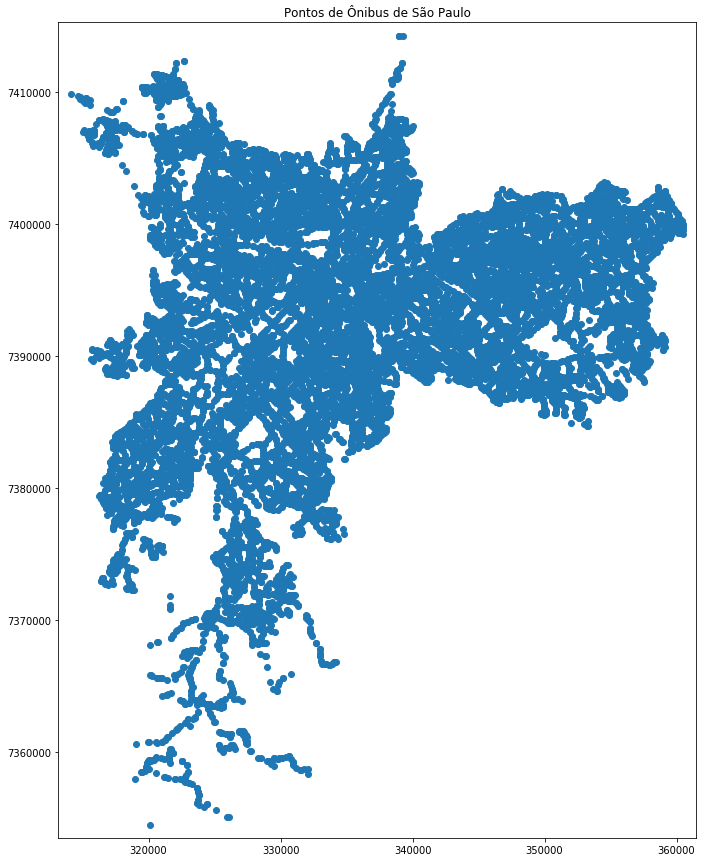

In [6]:
#Podemos plotar os pontos de ônibus de São Paulo usando o método plot no GeoDataFrame
ponto_onibus.plot(figsize=(15,15));

#Vamos definir o limite inferior do eixo y como sendo a menor latitude menos 1000 unidades e o limite superior do eixo y como sendo a maior latitude mais mil unidades 
plt.ylim(min(ponto_onibus['geometry'].y)-1000, max(ponto_onibus['geometry'].y)+1000)

#Aplicamos a mesma lógica para o eixo x, porém usando as longitudes como fator limitante do eixo
plt.xlim(min(ponto_onibus['geometry'].x)-1000, max(ponto_onibus['geometry'].x)+1000)

#Damos um nome para o nosso gráfico/mapa
plt.title('Pontos de Ônibus de São Paulo');

In [7]:
#Para utilizarmos os dados no folium precisamos que eles não estejam projetados (ou seja, que estejam com informações de latitude e longitude)

#Definindo uma projeção SIRGAS 2000 - UTM 23S
lat_long = Proj('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs')

#Aplicando a projeção criada para desprojetar os dados
ponto_onibus['long'], ponto_onibus['lat'] = lat_long(ponto_onibus['geometry'].x.values,ponto_onibus['geometry'].y.values, inverse=True)

#Verificando se as colunas long e lat foram criadas adequadamente
ponto_onibus.head()

,pt_enderec,pt_descric,pt_nome,geometry,long,lat
0,R Campina Grande/ Av Vitor Gabriel,Ref.: R Campina Grande/ Av Vitor Gabriel,Terminal Campo Limpo,POINT (319094.8392643448 7385513.190575708),-46.773403,-23.630912
1,Av Sapopemba/ Pc Felisberto Fernandes Da Silva,Ref.: Av Sapopemba/ Pc Felisberto Fernandes Da...,Terminal S. Mateus - Plat. C,POINT (349413.6174407193 7387737.499860981),-46.476049,-23.613940
2,R Dos Curimatas/ R Delfim Do Prata,Ref.: R Dos Curimatas/ R Delfim Do Prata,"R. Cardoso De Melo Neto, 497",POINT (332582.4540150195 7378078.002008434),-46.642067,-23.699499
3,Rua Forte Do Araxá / Forte Do Rio Negro,Ref.: Rua Forte Do Araxá / Forte Do Rio Negro,"Av. Forte Do Leme, 360",POINT (350253.9040314286 7389086.161001192),-46.467679,-23.601840
4,R Carlos Jose De Castilho/ R Seis,Ref.: R Carlos Jose De Castilho/ R Seis,"R. Morubixaba, 440",POINT (349019.6847513096 7393468.142417993),-46.479329,-23.562157


Agora que desprojetamos o dado, podemos visualizá-los de maneira interativa. Como o dataset é muito grande, vamos selecionar linhas randômicas. Nossa amostra representará 10% dos nossos dados.

In [8]:
#Gerando o mapa base
base_map_marker = genMap()

#Iterando as linhas randômicas selecionadas do GeoDataFrame e plotando os pontos de ônibus selecionados com seus respectivos endereços 
for point in ponto_onibus.sample(frac=0.05).iterrows():
    folium.Marker((point[-1]['lat'],point[-1]['long']), tooltip=point[-1]['pt_enderec']).add_to(base_map_marker)
    
base_map_marker

Visualizar pontos no espaço não é tarefa fácil. Para termos um entendimento mais profundo de como eles se distribuem, podemos fazer um mapa de Densidade de Kernel, também conhecido como HeatMap.

In [9]:
#gerando um mapa base
base_map = genMap()

#iterando os valores da coluna lat e da coluna long, criado pares ordenados e adicionando-os no mapa base
HeatMap(zip(ponto_onibus['lat'].values,ponto_onibus['long'].values)).add_to(base_map)

base_map

<h2 style='color:#32c3ff'>A Linha</h2>

<p>A linha é uma coleção de pontos conectados entre si. Assim, a linha é um conjunto ordenado de pares ordenados de coordenadas.

In [10]:
#Para entendermos melhor como as linhas se comportam, vamos visualizar as linhas do metrô de SP
metro_lin = gpd.read_file('../Datasets/Metrô (Linha) - Geosampa/SIRGAS_SHP_linhametro_line.shp')
metro_lin

,lmt_empres,lmt_nome,lmt_linha,geometry
0,METRO,AZUL,1,LINESTRING (336302.5650965384 7402460.18812453...
1,METRO,LILAS,5,LINESTRING (319683.7948884157 7382376.26948209...
2,METRO,VERMELHA,3,LINESTRING (329760.3972731024 7397269.21299079...
3,METRO,PRATA,15,LINESTRING (338383.7374782399 7390852.01433165...
4,VIAQUATRO,AMARELA,4,LINESTRING (333148.1378793134 7396175.50208235...
5,METRO,VERDE,2,LINESTRING (327406.7357830685 7394975.26085308...


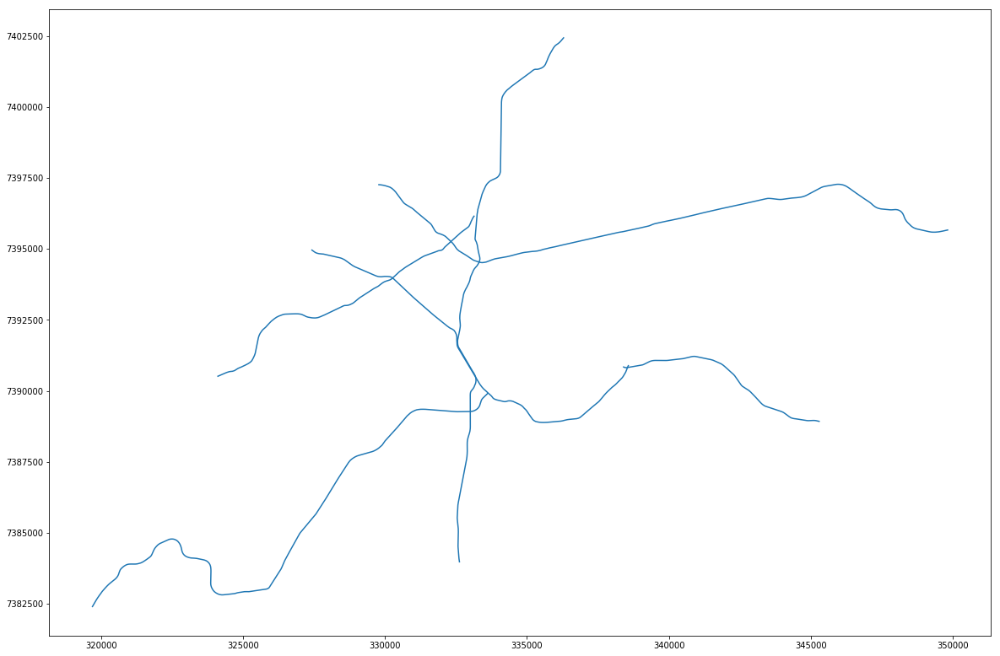

In [11]:
#Usando o matplotlib para visualizá-las
metro_lin.plot(figsize=(20,20));

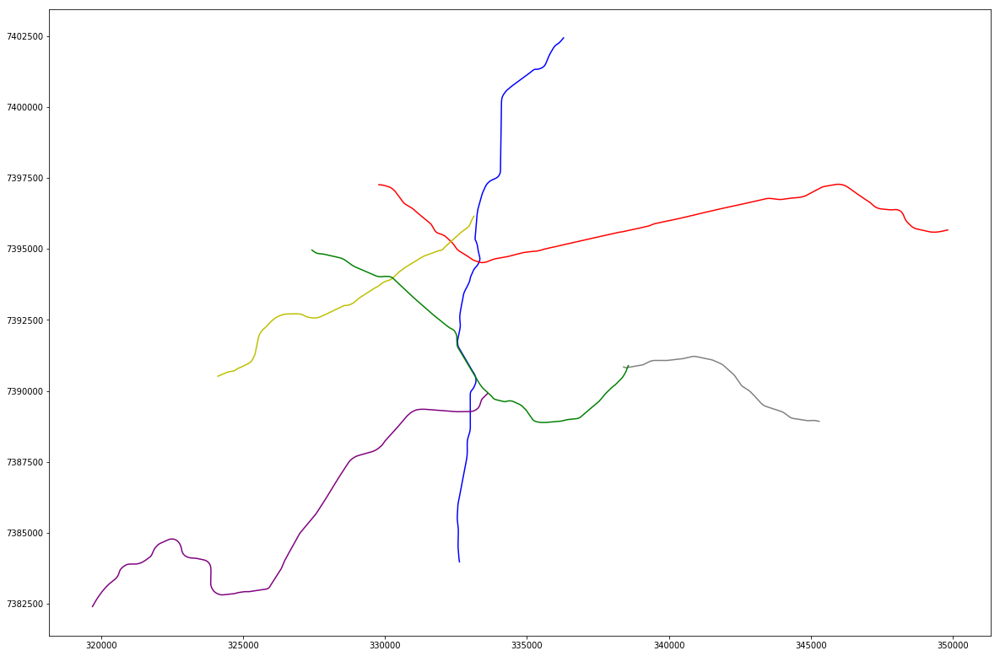

In [12]:
#criando um dicionário com as cores associadas ao nome de cada linha
colors = {'AZUL': 'b', 'VERMELHA': 'r', 'AMARELA': 'y', 'LILAS': 'purple', 'PRATA': 'gray', 'VERDE': 'g'}

#aplicando o dicionário para colorir as linhas
metro_lin.plot(figsize=(20,20), colors=metro_lin['lmt_nome'].apply(lambda x: colors[x]));

In [13]:
#Definindo a projeção do dado
metro_lin.crs = {'init': 'epsg:31983'}
metro_lin.crs

{'init': 'epsg:31983'}

In [14]:
metro_lin.plot_bokeh(figsize=(1000,600), hovertool_string='<h3>LINHA @lmt_nome</h3>', legend=False, title='Linhas de Metrô de São Paulo');

<h2 style='color:#32c3ff'>O Polígono</h2>

<p>O polígono é uma área do plano delimitada por um conjunto de linhas. É importante ressaltar que as linhas precisam ter uma relação topológica definida para que o polígono seja criado.

In [41]:
#Vamos importar os polígonos da Pesquisa Origem e Destino realizada pelo Metrô de SP
od_zonas = gpd.read_file('../Datasets/Pesquisa OD 2017/Mapas/Shape/Zonas_2017_region.shp')
od_zonas.set_index('NumeroZona', inplace=True)
od_zonas.head()

,NomeZona,NumeroMuni,NomeMunici,NumDistrit,NomeDistri,Area_ha_2,geometry
NumeroZona,,,,,,,
1,Sé,36,São Paulo,80,Sé,57.10,POLYGON Z ((333739.4152348957 7394619.83803825...
2,Parque Dom Pedro,36,São Paulo,80,Sé,113.64,POLYGON Z ((333106.145952367 7395425.480039079...
3,Praça João Mendes,36,São Paulo,80,Sé,47.75,POLYGON Z ((333353.2112687788 7393933.15566073...
4,Ladeira da Memória,36,São Paulo,67,República,75.11,POLYGON Z ((332742.6191205291 7394795.32797842...
5,República,36,São Paulo,67,República,74.95,POLYGON Z ((332983.9615528719 7395262.57794273...


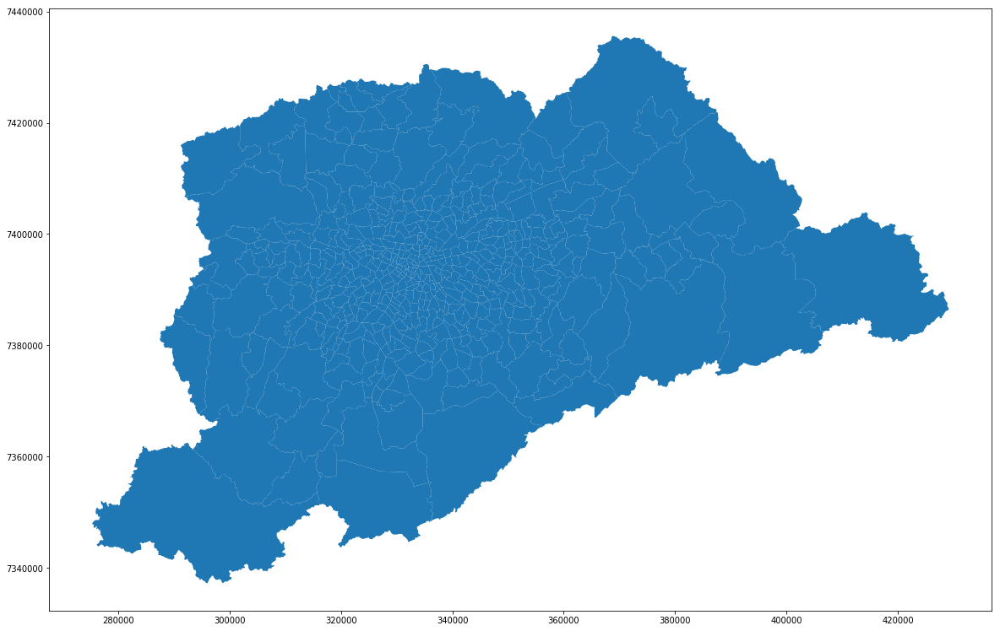

In [42]:
#Plottando os polígonos com Matplotlib
od_zonas.plot(figsize=(20,20));

In [43]:
od_zonas.plot_bokeh(legend=False, figsize=(1200,800), hovertool_string='<h3>@NomeZona</h3>', title='Zonas da Pesquisa Origem e Destino');

In [44]:
#Vamos importar os dados de umas das tabelas de resultado da Pesquisa Origem e Destino
dados_pesquisa = pd.read_excel('../Datasets/Pesquisa OD 2017/Tabelas Gerais/Dados Gerais OD2017.xlsx',
                               sheet_name='Tabela 23',
                               skiprows=9,
                               header=None)

dados_pesquisa.columns = ['ZonaDestino','TrabalhoIndústria','TrabalhoComércio','TrabalhoServiços','Educação','Compras',
                                        'Saúde','Lazer','ProcurarEmprego','AssuntosPessoais','Refeição','Total']

dados_pesquisa.set_index('ZonaDestino', inplace=True)

dados_pesquisa.head()

,TrabalhoIndústria,TrabalhoComércio,TrabalhoServiços,Educação,Compras,Saúde,Lazer,ProcurarEmprego,AssuntosPessoais,Refeição,Total
ZonaDestino,,,,,,,,,,,
1,1591.133652,11034.710399,88679.898494,6998.712778,6750.756902,1417.868096,3221.646138,3124.949082,20311.741044,17026.069765,160157.486349
2,2260.191831,32580.231837,38486.622615,4437.955002,37998.968021,1537.449370,2301.892390,1260.896286,10889.051978,6553.151343,138306.410674
3,1604.029288,3712.922295,29270.283697,8727.133602,3510.662331,2695.805468,1747.375551,169.826993,5893.684312,5171.113499,62502.837037
4,277.542242,3886.723708,35275.163482,8028.391341,2822.216638,3420.240525,5508.785205,369.956822,15042.666723,3653.875587,78285.562275
5,2606.103401,22966.331926,108022.346484,6402.628275,3979.421287,3410.343623,5459.393637,5248.907220,14165.107740,14892.159922,187152.743515


In [45]:
#Vamos fazer um join da tabela com o shapefile usando o ID (coluna ZonaDestino)
od_zonas['TrabalhoIndústria%'] = round((dados_pesquisa['TrabalhoIndústria']/dados_pesquisa['Total'])*100,2)
od_zonas.head()

,NomeZona,NumeroMuni,NomeMunici,NumDistrit,NomeDistri,Area_ha_2,geometry,TrabalhoIndústria%
NumeroZona,,,,,,,,
1,Sé,36,São Paulo,80,Sé,57.10,POLYGON Z ((333739.4152348957 7394619.83803825...,0.99
2,Parque Dom Pedro,36,São Paulo,80,Sé,113.64,POLYGON Z ((333106.145952367 7395425.480039079...,1.63
3,Praça João Mendes,36,São Paulo,80,Sé,47.75,POLYGON Z ((333353.2112687788 7393933.15566073...,2.57
4,Ladeira da Memória,36,São Paulo,67,República,75.11,POLYGON Z ((332742.6191205291 7394795.32797842...,0.35
5,República,36,São Paulo,67,República,74.95,POLYGON Z ((332983.9615528719 7395262.57794273...,1.39


In [46]:
od_zonas['TrabalhoServiços%'] = round((dados_pesquisa['TrabalhoServiços']/dados_pesquisa['Total'])*100,2)
od_zonas.head()

,NomeZona,NumeroMuni,NomeMunici,NumDistrit,NomeDistri,Area_ha_2,geometry,TrabalhoIndústria%,TrabalhoServiços%
NumeroZona,,,,,,,,,
1,Sé,36,São Paulo,80,Sé,57.10,POLYGON Z ((333739.4152348957 7394619.83803825...,0.99,55.37
2,Parque Dom Pedro,36,São Paulo,80,Sé,113.64,POLYGON Z ((333106.145952367 7395425.480039079...,1.63,27.83
3,Praça João Mendes,36,São Paulo,80,Sé,47.75,POLYGON Z ((333353.2112687788 7393933.15566073...,2.57,46.83
4,Ladeira da Memória,36,São Paulo,67,República,75.11,POLYGON Z ((332742.6191205291 7394795.32797842...,0.35,45.06
5,República,36,São Paulo,67,República,74.95,POLYGON Z ((332983.9615528719 7395262.57794273...,1.39,57.72


In [51]:
od_zonas.plot_bokeh(category='TrabalhoIndústria%',
                    figsize=(1200,800),
                    title='Porcentagem de Viagens Totais Atraídas por motivo de Trabalho na Indústria',
                    legend=False, hovertool_string='<h3>@NomeZona<h3>');

In [55]:
od_zonas.plot_bokeh(category='TrabalhoServiços%',
                    figsize=(1200,800),
                    title='Porcentagem de Viagens Totais Atraídas por motivo de Trabalho no Setor de Serviços',
                    legend=False,
                    hovertool_string='<h3>@NomeZona<h3>');